In [1]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import numpy as np

import  seaborn as sns
import  scipy.stats as stats

In [5]:
rasad = pd.read_csv(r'C:\Users\Sharif\Downloads\Compressed\data_mining_test_Project\Data.csv')
rasad.head()

,Unnamed: 0,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,...,n_n_buy,n_i_sell,n_n_sell,f1,f2,f3,f4,f5,f6,signal
0,0,20110711,12500,12500,12500,12500,30320681.0,89389319.0,0.0,119710000.0,...,166.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,1,20110712,12610,12940,12511,12513,839652.0,2603130.0,3327282.0,115500.0,...,9.0,1153.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,2,20110713,12515,12685,12501,12502,305908.0,6485132.0,6324540.0,466500.0,...,9.0,986.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,3,20110719,12629,12629,12500,12501,98549.0,1580602.0,1578151.0,101000.0,...,3.0,261.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,4,20110720,12501,12515,12500,12500,104577.0,2076431.0,1822008.0,359000.0,...,2.0,303.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [6]:
rasad=rasad.drop(['Unnamed: 0'],axis=1)
rasad.head()

,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,n_i_buy,n_n_buy,n_i_sell,n_n_sell,f1,f2,f3,f4,f5,f6,signal
0,20110711,12500,12500,12500,12500,30320681.0,89389319.0,0.0,119710000.0,5736.0,166.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,20110712,12610,12940,12511,12513,839652.0,2603130.0,3327282.0,115500.0,237.0,9.0,1153.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,20110713,12515,12685,12501,12502,305908.0,6485132.0,6324540.0,466500.0,49.0,9.0,986.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,20110719,12629,12629,12500,12501,98549.0,1580602.0,1578151.0,101000.0,26.0,3.0,261.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,20110720,12501,12515,12500,12500,104577.0,2076431.0,1822008.0,359000.0,10.0,2.0,303.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [4]:
# simple normalize
rasad['Open'] = (rasad['Open']-rasad['Open'].min())/(rasad['Open'].max()-rasad['Open'].min())
rasad['High'] = (rasad['High']-rasad['High'].min())/(rasad['High'].max()-rasad['High'].min())
rasad['Low'] = (rasad['Low']-rasad['Low'].min())/(rasad['Low'].max()-rasad['Low'].min())
rasad['Close'] = (rasad['Close']-rasad['Close'].min())/(rasad['Close'].max()-rasad['Close'].min())
rasad.head()

,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,n_i_buy,n_n_buy,n_i_sell,n_n_sell,f1,f2,f3,f4,f5,f6,signal
0,20110711,0.013433,0.012767,0.014385,0.013582,30320681.0,89389319.0,0.0,119710000.0,5736.0,166.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,20110712,0.013761,0.014074,0.014420,0.013622,839652.0,2603130.0,3327282.0,115500.0,237.0,9.0,1153.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,20110713,0.013478,0.013317,0.014389,0.013588,305908.0,6485132.0,6324540.0,466500.0,49.0,9.0,986.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,20110719,0.013818,0.013150,0.014385,0.013585,98549.0,1580602.0,1578151.0,101000.0,26.0,3.0,261.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,20110720,0.013436,0.012812,0.014385,0.013582,104577.0,2076431.0,1822008.0,359000.0,10.0,2.0,303.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [5]:
# special normalize for V
rasad['v_i_buy'] = (rasad['v_i_buy'])/(rasad['v_i_buy']+rasad['v_n_buy']+rasad['v_i_sell']+rasad['v_n_sell'])
rasad['v_n_buy'] = (rasad['v_n_buy'])/(rasad['v_i_buy']+rasad['v_n_buy']+rasad['v_i_sell']+rasad['v_n_sell'])
rasad['v_i_sell'] = (rasad['v_i_sell'])/(rasad['v_i_buy']+rasad['v_n_buy']+rasad['v_i_sell']+rasad['v_n_sell'])
rasad['v_n_sell'] = (rasad['v_n_sell'])/(rasad['v_i_buy']+rasad['v_n_buy']+rasad['v_i_sell']+rasad['v_n_sell'])
rasad.head()

,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,n_i_buy,n_n_buy,n_i_sell,n_n_sell,f1,f2,f3,f4,f5,f6,signal
0,20110711,0.013433,0.012767,0.014385,0.013582,0.126642,0.427497,0.000000,1.000000,5736.0,166.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,20110712,0.013761,0.014074,0.014420,0.013622,0.121944,0.430560,0.966451,0.999987,237.0,9.0,1153.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,20110713,0.013478,0.013317,0.014389,0.013588,0.022523,0.488479,0.931306,0.999997,49.0,9.0,986.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,20110719,0.013818,0.013150,0.014385,0.013585,0.029345,0.484884,0.939850,0.999986,26.0,3.0,261.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,20110720,0.013436,0.012812,0.014385,0.013582,0.023974,0.487718,0.835397,0.999996,10.0,2.0,303.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [7]:
def EMA(S:np.ndarray, L:int, r:float=1):
    a = (1 + r) / (L + r)
    nD0 = S.size
    nD = nD0 - L + 1
    M = np.zeros(nD)
    M[0] = np.mean(S[:L])
    for i in range(1, nD):
        M[i] = a * S[i + L - 1] + (1 - a) * M[i - 1]
    return M

In [8]:
def MACD(C:np.ndarray, L1:int, L2:int, Ls:int):
    ema1 = EMA(C, L1)
    ema2 = EMA(C, L2)
    ema1 = ema1[-ema2.size:]
    macd = ema1 - ema2
    signal = EMA(macd, Ls)
    macd = macd[-signal.size:]
    histogram = macd - signal
    return ema1, ema2, macd, signal, histogram

In [24]:
len(macd)

2608

In [30]:
C = rasad['Close'].to_numpy()
ema1, ema2, macd, signal, histogram = MACD(C, 12, 26, 9)
macd_list=macd.tolist()
L=[]
for i in range (len(rasad)):
    L.append('unknown')
rasad['MACD']=L
for i in range(33, len(rasad)):
    rasad['MACD'][i]=macd_list[i-33]

rasad

C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\3273024097.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad['MACD'][i]=macd_list[i-33]
C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\3273024097.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad['MACD'][i]=macd_list[i-33]
C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\3273024097.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad['MACD'][i]=macd_list[i-33]
C

,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,n_i_buy,...,f1,f2,f3,f4,f5,f6,signal,MACD,RSI,volume
0,20110711,12500,12500,12500,12500,30320681.0,89389319.0,0.0,119710000.0,5736.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,239420000.0
1,20110712,12610,12940,12511,12513,839652.0,2603130.0,3327282.0,115500.0,237.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,6885564.0
2,20110713,12515,12685,12501,12502,305908.0,6485132.0,6324540.0,466500.0,49.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,13582080.0
3,20110719,12629,12629,12500,12501,98549.0,1580602.0,1578151.0,101000.0,26.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,3358302.0
4,20110720,12501,12515,12500,12500,104577.0,2076431.0,1822008.0,359000.0,10.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,4362016.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2636,20230710,142600,143300,138000,140000,391689.0,118067.0,474867.0,34889.0,469.0,...,0.119317,0.296359,1.000000,0.974968,0.093904,-0.226698,NaN,-6878.349985,34.996847,1019512.0
2637,20230711,139000,139000,133300,133650,377747.0,20807.0,398354.0,200.0,347.0,...,0.182436,0.291115,1.000000,1.027145,0.005133,-3.953175,NaN,-7205.514613,30.024964,797108.0
2638,20230712,133550,138950,129200,133400,441901.0,50931.0,435832.0,57000.0,540.0,...,0.302494,0.450181,0.999717,1.064989,0.221131,-6.809376,NaN,-7399.669071,29.845194,985664.0
2639,20230715,133800,138900,133650,136450,507663.0,21897.0,344784.0,184776.0,449.0,...,0.343409,0.508836,0.992386,1.058249,-0.007614,-7.833776,NaN,-7224.15283,34.961427,1059120.0


In [38]:
MCD_signal=[]
for i in range(33):
    MCD_signal.append(0)
for j in range(33 ,len(rasad)):
    if macd[j-33]==signal[j-33] and macd[j-34]>0:
        MCD_signal.append(1)
    elif macd[j-33]==signal[j-33] and macd[j-34]<0:
        MCD_signal.append(-1)
    else:
        MCD_signal.append(0)

datas={
    "signal":MCD_signal,
    "Close":rasad.Close.tolist() 
}
sample_eval_data=pd.DataFrame(datas)
print(sample_eval_data)        


      signal   Close
0          0   12500
1          0   12513
2          0   12502
3          0   12501
4          0   12500
...      ...     ...
2636       0  140000
2637       0  133650
2638       0  133400
2639       0  136450
2640       0  136500

[2641 rows x 2 columns]


In [45]:
Signal=[-1]
for i in range(1 ,len(rasad)-1):
    Signal.append(0)

Signal.append(1)

datas={
    "signal":Signal,
    "Close":rasad.Close.tolist() 
}
sample_eval_data=pd.DataFrame(datas)
print(sample_eval_data) 

      signal   Close
0         -1   12500
1          0   12513
2          0   12502
3          0   12501
4          0   12500
...      ...     ...
2636       0  140000
2637       0  133650
2638       0  133400
2639       0  136450
2640       1  136500

[2641 rows x 2 columns]


In [44]:
sample_eval_data[sample_eval_data.signal==0]

,signal,Close
0,0.0,12500
1,0.0,12513
2,0.0,12502
3,0.0,12501
4,0.0,12500
...,...,...
2636,0.0,140000
2637,0.0,133650
2638,0.0,133400
2639,0.0,136450


In [46]:
import numpy as np
import pandas as pd


def eval_strategy():

    #df = pd.read_csv("./sample_eval_data.csv")

    bot = Bot(sample_eval_data)
    bot.trade()

    profit, win_rate = bot.get_profit(), bot.get_win_rate()


    return profit, win_rate


class Bot:
    """
    This class provide tradding management and work with sell and buy condition.

    input:
        - df: pd.DataFrame
                columns=['close', 'signal'],
                signal=[-1, 0, 1] such that : -1: buy, 0: hold, 1: sell
    """

    def __init__(self, df: pd.DataFrame) -> None:
        self.df = df
        self.df['signal'] = self.df['signal'].astype(float)
        self.trades = list()
        self.in_trade = False

    def trade(self):
        """ trade function work with signal """

        for i in self.df.index:
            # buy
            if self.df.loc[i, 'signal'] == -1 and not self.in_trade:

                position = dict()
                position[i] = self.df.loc[i, 'Close']
                self.in_trade = True
            # sell
            elif self.df.loc[i, 'signal'] == 1 and self.in_trade:

                position[i] = self.df.loc[i, 'Close']
                self.trades.append(position)
                self.in_trade = False
            # hold
            elif self.df.loc[i, 'signal'] == 0:
                continue

    def get_win_rate(self):
        return np.round(sum(
            [1 if list(pos.values())[0] < list(pos.values())
             [1] else 0 for pos in self.trades]
        ) / len(self.trades), 4)

    def get_profit(self):

        profit = 1
        for pos in self.trades:
            cl = np.array(list(pos.values()))
            profit *= cl[1:] / cl[:-1] - 0.0125

        return np.round(profit[0], 4)

    def __len__(self):
        return len(self.trades)

    def __repr__(self):
        return f"<WinRate: {self.get_win_rate()}, Profit: {self.get_profit()}>"

if __name__ == "__main__":
    profit, win_rate = eval_strategy()
    print("profit:", profit,"\nwin_rate:", win_rate)


profit: 10.9075 
win_rate: 1.0


In [52]:
Signal=[]
for i in range(105):
    Signal.append(0)
Signal[105]

IndexError: list index out of range

In [53]:
Signal=[]
for i in range(len(rasad)):
    Signal.append(0)
    
Signal[106]=-1
Signal[121]=1
Signal[140]=-1
Signal[171]=1
Signal[253]=-1
Signal[262]=1
Signal[322]=-1
Signal[335]=1
Signal[382]=-1
Signal[415]=1
Signal[443]=-1
Signal[485]=1
Signal[620]=-1
Signal[654]=1
Signal[1126]=-1
Signal[1163]=1
Signal[1328]=-1
Signal[1447]=1
Signal[1438]=-1
Signal[1558]=1
Signal[1654]=-1
Signal[1673]=1
Signal[1694]=-1
Signal[1761]=1
Signal[1894]=-1
Signal[1907]=1
Signal[1927]=-1
Signal[1937]=1
Signal[2048]=-1
Signal[2055]=1
Signal[2190]=-1
Signal[2241]=1
Signal[2326]=-1
Signal[2355]=1
Signal[2504]=-1
Signal[2546]=1

datas={
    "signal":Signal,
    "Close":rasad.Close.tolist() 
}
sample_eval_data=pd.DataFrame(datas)
print(sample_eval_data)

      signal   Close
0          0   12500
1          0   12513
2          0   12502
3          0   12501
4          0   12500
...      ...     ...
2636       0  140000
2637       0  133650
2638       0  133400
2639       0  136450
2640       0  136500

[2641 rows x 2 columns]


In [54]:
import numpy as np
import pandas as pd


def eval_strategy():

    #df = pd.read_csv("./sample_eval_data.csv")

    bot = Bot(sample_eval_data)
    bot.trade()

    profit, win_rate = bot.get_profit(), bot.get_win_rate()


    return profit, win_rate


class Bot:
    """
    This class provide tradding management and work with sell and buy condition.

    input:
        - df: pd.DataFrame
                columns=['close', 'signal'],
                signal=[-1, 0, 1] such that : -1: buy, 0: hold, 1: sell
    """

    def __init__(self, df: pd.DataFrame) -> None:
        self.df = df
        self.df['signal'] = self.df['signal'].astype(float)
        self.trades = list()
        self.in_trade = False

    def trade(self):
        """ trade function work with signal """

        for i in self.df.index:
            # buy
            if self.df.loc[i, 'signal'] == -1 and not self.in_trade:

                position = dict()
                position[i] = self.df.loc[i, 'Close']
                self.in_trade = True
            # sell
            elif self.df.loc[i, 'signal'] == 1 and self.in_trade:

                position[i] = self.df.loc[i, 'Close']
                self.trades.append(position)
                self.in_trade = False
            # hold
            elif self.df.loc[i, 'signal'] == 0:
                continue

    def get_win_rate(self):
        return np.round(sum(
            [1 if list(pos.values())[0] < list(pos.values())
             [1] else 0 for pos in self.trades]
        ) / len(self.trades), 4)

    def get_profit(self):

        profit = 1
        for pos in self.trades:
            cl = np.array(list(pos.values()))
            profit *= cl[1:] / cl[:-1] - 0.0125

        return np.round(profit[0], 4)

    def __len__(self):
        return len(self.trades)

    def __repr__(self):
        return f"<WinRate: {self.get_win_rate()}, Profit: {self.get_profit()}>"

if __name__ == "__main__":
    profit, win_rate = eval_strategy()
    print("profit:", profit,"\nwin_rate:", win_rate)


profit: 157.9295 
win_rate: 1.0


In [55]:
rasad['Signal']=Signal
rasad

,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,n_i_buy,...,f2,f3,f4,f5,f6,signal,MACD,RSI,volume,Signal
0,20110711,12500,12500,12500,12500,30320681.0,89389319.0,0.0,119710000.0,5736.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,239420000.0,0
1,20110712,12610,12940,12511,12513,839652.0,2603130.0,3327282.0,115500.0,237.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,6885564.0,0
2,20110713,12515,12685,12501,12502,305908.0,6485132.0,6324540.0,466500.0,49.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,13582080.0,0
3,20110719,12629,12629,12500,12501,98549.0,1580602.0,1578151.0,101000.0,26.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,3358302.0,0
4,20110720,12501,12515,12500,12500,104577.0,2076431.0,1822008.0,359000.0,10.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,unknown,unknown,4362016.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2636,20230710,142600,143300,138000,140000,391689.0,118067.0,474867.0,34889.0,469.0,...,0.296359,1.000000,0.974968,0.093904,-0.226698,NaN,-6878.349985,34.996847,1019512.0,0
2637,20230711,139000,139000,133300,133650,377747.0,20807.0,398354.0,200.0,347.0,...,0.291115,1.000000,1.027145,0.005133,-3.953175,NaN,-7205.514613,30.024964,797108.0,0
2638,20230712,133550,138950,129200,133400,441901.0,50931.0,435832.0,57000.0,540.0,...,0.450181,0.999717,1.064989,0.221131,-6.809376,NaN,-7399.669071,29.845194,985664.0,0
2639,20230715,133800,138900,133650,136450,507663.0,21897.0,344784.0,184776.0,449.0,...,0.508836,0.992386,1.058249,-0.007614,-7.833776,NaN,-7224.15283,34.961427,1059120.0,0


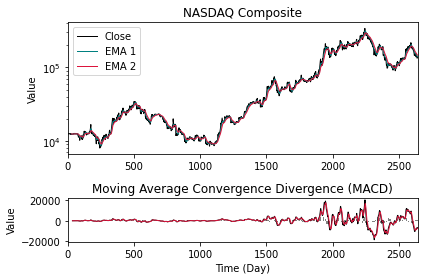

In [29]:
T = np.arange(start=1, stop=C.size + 1, step=1)
plt.subplot(3, 1, (1, 2))
plt.semilogy(T, C, ls='-', lw=1, c='k', label='Close')
plt.semilogy(T[-ema1.size:], ema1, ls='-', lw=1, c='teal', label='EMA 1')
plt.semilogy(T[-ema2.size:], ema2, ls='-', lw=1.0, c='crimson', label='EMA 2')
plt.title('NASDAQ Composite')
plt.ylabel('Value')
plt.xlim(left=0, right=C.size + 1)
plt.tight_layout()
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(T[-macd.size:], macd, ls='-', lw=1, c='k', label='MACD Line')
plt.plot(T[-signal.size:], signal, ls='-', lw=1, c='crimson', label='Signal Line')
plt.bar(T[-signal.size:], histogram, color='grey', label='Histogram')
plt.title('Moving Average Convergence Divergence (MACD)')
plt.xlabel('Time (Day)')
plt.ylabel('Value')
plt.xlim(left=0, right=C.size + 1)
plt.tight_layout()
#plt.legend()

plt.show()

In [12]:
def RSI(C:np.ndarray, L:int):
    nD0 = C.size
    nD1 = nD0 - 1
    U = np.zeros(nD1)
    D = np.zeros(nD1)
    for i in range(nD1):
        d = C[i + 1] - C[i]
        if d > 0:
            U[i] = d
        else:
            D[i] = -d
    emaU = EMA(U, L, r=0)
    emaD = EMA(D, L, r=0)
    RS = emaU / emaD
    rsi = 100 - 100 / (1 + RS)
    return rsi

def SMMA(S:np.ndarray, L:int):
    nD0 = S.size
    nD = nD0 - L + 1
    M = np.zeros(nD)
    M[0] = np.mean(S[:L])
    for i in range(1, nD):
        M[i] = (S[i + L - 1] + (L - 1) * M[i - 1]) / L
    return M

In [13]:
rsi = RSI(C, 14)
rsi_list=rsi.tolist()
L=[]
for i in range (len(rasad)):
    L.append('unknown')
rasad['RSI']=L
for i in range(14, len(rasad)):
    rasad['RSI'][i]=rsi_list[i-14]

C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\3404205157.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad['RSI'][i]=rsi_list[i-14]
C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\3404205157.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad['RSI'][i]=rsi_list[i-14]
C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\3404205157.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad['RSI'][i]=rsi_list[i-14]
C:\User

In [14]:
L=[]
for  i in range(len(rasad)):
    L.append(rasad['v_i_buy'][i]+rasad['v_n_buy'][i]+rasad['v_i_sell'][i]+rasad['v_n_sell'][i])
rasad['volume']=L

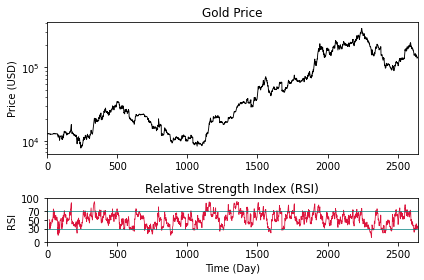

In [15]:
C = rasad['Close'].to_numpy()
T = np.arange(start=1, stop=C.size + 1, step=1)
plt.subplot(3, 1, (1, 2))
plt.semilogy(T, C, ls='-', lw=0.9, c='k')
plt.title('Gold Price')
plt.ylabel('Price (USD)')
plt.xlim(left=0, right=C.size + 1)
plt.tight_layout()

plt.subplot(3, 1, 3)
plt.plot(T[-rsi.size:], rsi, ls='-', lw=0.8, c='crimson')
plt.axhline(30, ls='-', lw=0.7, c='teal')
plt.axhline(70, ls='-', lw=0.7, c='teal')
plt.title('Relative Strength Index (RSI)')
plt.xlabel('Time (Day)')
plt.ylabel('RSI')
plt.xlim(left=0, right=C.size + 1)
plt.ylim(bottom=0, top=100)
plt.yticks([0, 30, 50, 70, 100], [0, 30, 50, 70, 100])
plt.tight_layout()

plt.show()

In [20]:
RSI_signal=[]
for i in range(len(rasad)):
    if rasad.RSI[i]=='unknown':
        RSI_signal.append(0)
    elif rasad.RSI[i]<=30:
        RSI_signal.append(-1)
    elif rasad.RSI[i]>=70:
        RSI_signal.append(1)
    else:
        RSI_signal.append(0)

datas={
    "signal":RSI_signal,
    "Close":rasad.Close.tolist() 
}
sample_eval_data=pd.DataFrame(datas)
print(sample_eval_data)

      signal   Close
0          0   12500
1          0   12513
2          0   12502
3          0   12501
4          0   12500
...      ...     ...
2636       0  140000
2637       0  133650
2638      -1  133400
2639       0  136450
2640       0  136500

[2641 rows x 2 columns]


In [23]:
import numpy as np
import pandas as pd


def eval_strategy():

    #df = pd.read_csv("./sample_eval_data.csv")

    bot = Bot(sample_eval_data)
    bot.trade()

    profit, win_rate = bot.get_profit(), bot.get_win_rate()


    return profit, win_rate


class Bot:
    """
    This class provide tradding management and work with sell and buy condition.

    input:
        - df: pd.DataFrame
                columns=['close', 'signal'],
                signal=[-1, 0, 1] such that : -1: buy, 0: hold, 1: sell
    """

    def __init__(self, df: pd.DataFrame) -> None:
        self.df = df
        self.df['signal'] = self.df['signal'].astype(float)
        self.trades = list()
        self.in_trade = False

    def trade(self):
        """ trade function work with signal """

        for i in self.df.index:
            # buy
            if self.df.loc[i, 'signal'] == -1 and not self.in_trade:

                position = dict()
                position[i] = self.df.loc[i, 'Close']
                self.in_trade = True
            # sell
            elif self.df.loc[i, 'signal'] == 1 and self.in_trade:

                position[i] = self.df.loc[i, 'Close']
                self.trades.append(position)
                self.in_trade = False
            # hold
            elif self.df.loc[i, 'signal'] == 0:
                continue

    def get_win_rate(self):
        return np.round(sum(
            [1 if list(pos.values())[0] < list(pos.values())
             [1] else 0 for pos in self.trades]
        ) / len(self.trades), 4)

    def get_profit(self):

        profit = 1
        for pos in self.trades:
            cl = np.array(list(pos.values()))
            profit *= cl[1:] / cl[:-1] - 0.0125

        return np.round(profit[0], 4)

    def __len__(self):
        return len(self.trades)

    def __repr__(self):
        return f"<WinRate: {self.get_win_rate()}, Profit: {self.get_profit()}>"

if __name__ == "__main__":
    profit, win_rate = eval_strategy()
    print("profit:", profit,"\nwin_rate:", win_rate)


profit: 0.8487 
win_rate: 0.6667


In [58]:
features = pd.DataFrame(index=rasad.index).sort_index()
features['f01'] = (rasad.Close/rasad.Open-1).tolist() # daily return
features['f02'] = (rasad.Open/rasad.Close.shift(1)-1).tolist() 
features['f03'] = (rasad.volume.apply(np.log)).tolist()
features['f04'] = (rasad.v_i_buy.apply(np.log)).tolist()
features['f05'] = (rasad.v_n_buy.apply(np.log)).tolist()
features['f06'] = (rasad.v_i_sell.apply(np.log)).tolist()
features['f07'] = (rasad.v_n_sell.apply(np.log)).tolist()
features['f08'] = (rasad.volume.diff()).tolist() # change since prior day
features['f09'] = (rasad.volume.diff(50)).tolist() # change since 50 days prior
features['f10'] = (rasad.volume.pct_change() ).tolist()
features['f11'] = (rasad.v_i_buy.pct_change()).tolist()
features['f12'] = (rasad.v_n_buy.pct_change()).tolist()
features['f13'] = (rasad.v_i_sell.pct_change()).tolist()
features['f14'] = (rasad.v_n_sell.pct_change()).tolist()
# log of 5 day moving average of volume
#ma_5 = lambda x: x.rolling(5).mean()
features['f15'] = (rasad.volume.rolling(5).mean()\
.apply(np.log) ).tolist()
features['f16'] = (rasad.v_i_buy.rolling(5).mean()\
.apply(np.log)).tolist() 
features['f17'] = (rasad.v_n_buy.rolling(5).mean()\
.apply(np.log)).tolist() 
features['f18'] = (rasad.v_i_sell.rolling(5).mean()\
.apply(np.log) ).tolist()
features['f19'] = (rasad.v_n_sell.rolling(5).mean()\
.apply(np.log)).tolist()

In [59]:
# daily volume vs. 200 day moving average

features['f20'] = (rasad.volume/rasad.volume\
.rolling(200).mean()-1).tolist()

# daily closing price vs. 50 day exponential moving avg

features['f21'] = (rasad.Close/ rasad.Close\
.ewm(span=50).mean()-1).tolist()

#zscore_fxn = lambda x: (x - x.mean()) / x.std()
def zscore_fxn(x):
    return (x - rasad.Close.mean()) / rasad.Close.std()
features['f22'] =(rasad.Close.apply(zscore_fxn)).tolist()
#features.f22.unstack().plot.kde(title='Z-Scores (not quite accurate)')

In [60]:

features['f23'] = (features['f10'].apply(np.sign)).tolist()
#plus_minus_fxn = lambda x: x.rolling(20).sum()
features['f24'] = (features['f23'].rolling(20).sum()).tolist()


In [61]:
features['f25']=(rasad.MACD).tolist()
features['f26']=(rasad.RSI).tolist()
features['f1']=(rasad.f1).tolist()
features['f2']=(rasad.f2).tolist()
features['f3']=(rasad.f3).tolist()
features['f4']=(rasad.f4).tolist()
features['f5']=(rasad.f5).tolist()
features['f6']=(rasad.f6).tolist()
features['f33']=(rasad.v_i_buy/rasad.n_i_buy).tolist()
features['f34']=(rasad.v_n_buy/rasad.n_n_buy).tolist()
features['f35']=(rasad.v_i_sell/rasad.n_i_sell).tolist()
features['f36']=(rasad.v_n_sell/rasad.n_n_sell).tolist()

In [62]:
features['Signal']=rasad.Signal.tolist()


In [63]:
missing_val=features.isnull()
rasad1=features.copy()
for i in range(len(features)):
    for j in range(len(features.loc[features.index[i]])):
        if missing_val.loc[missing_val.index[i]][j]==True:
            rasad1=rasad1.drop(features.index[i])
            break
rasad1

,f01,f02,f03,f04,f05,f06,f07,f08,f09,f10,...,f2,f3,f4,f5,f6,f33,f34,f35,f36,Signal
200,-0.032930,-0.000417,13.276553,9.591376,12.531917,12.507806,9.963547,392834.0,82054.0,2.061883,...,0.169788,0.440030,0.213280,0.247194,-1.057563,1829.750000,138520.0,9658.571429,21238.000000,0
201,0.042753,-0.007931,13.881338,8.925454,13.174007,11.814947,12.896120,484686.0,793962.0,0.830858,...,0.235277,0.254522,0.240068,0.060869,-6.088673,1074.428571,263250.0,5410.360000,132920.666667,0
204,0.000000,0.012756,11.970945,8.860357,11.184421,10.276670,10.819778,79490.0,96564.0,1.011272,...,0.302212,0.154043,0.244845,-0.100479,-4.661054,7047.000000,72000.0,5809.400000,50000.000000,0
206,0.038961,-0.007732,13.748913,10.384987,12.984057,12.439111,12.279788,556288.0,780740.0,1.466679,...,0.209039,0.232554,0.221262,0.003074,-4.817833,10790.000000,435416.0,7426.058824,35883.333333,0
208,-0.021284,-0.020262,11.761425,10.574006,10.126631,10.041117,10.625076,96732.0,100132.0,3.073003,...,0.236719,0.257656,0.234810,0.048134,0.529863,1700.217391,25000.0,2868.875000,41154.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2614,-0.052004,0.006466,14.197669,12.447928,13.077366,12.900931,12.713002,351606.0,-1111622.0,0.315671,...,0.489516,0.975648,0.879090,0.249219,-8.661301,437.666667,119500.0,2142.700535,110679.000000,0
2615,0.019667,-0.031946,13.968530,12.641514,12.519221,13.059336,11.637044,-300096.0,-1544902.0,-0.204782,...,0.572593,0.478911,0.894507,-0.521089,-8.587677,674.954148,54709.0,850.469203,56607.500000,0
2616,-0.039461,-0.005884,14.080660,13.052953,12.129953,12.950782,12.348644,138278.0,-536964.0,0.118658,...,0.698577,0.227455,0.811151,-0.717445,-8.698489,587.496222,37068.2,5074.289157,76882.333333,0
2617,0.044254,-0.040739,13.902972,13.134608,10.585068,13.027061,11.420273,-212226.0,-20792.0,-0.162797,...,0.805722,0.620109,0.737153,-0.355539,-8.766849,743.259912,9885.0,1235.187500,45575.500000,0


In [65]:

# change the data type of column 'B' from string to integer
rasad1['f26'] =rasad1['f26'].astype('float64')
rasad1['f25'] =rasad1['f25'].astype('float64')
print(rasad1.dtypes)

f01       float64
f02       float64
f03       float64
f04       float64
f05       float64
f06       float64
f07       float64
f08       float64
f09       float64
f10       float64
f11       float64
f12       float64
f13       float64
f14       float64
f15       float64
f16       float64
f17       float64
f18       float64
f19       float64
f20       float64
f21       float64
f22       float64
f23       float64
f24       float64
f25       float64
f26       float64
f1        float64
f2        float64
f3        float64
f4        float64
f5        float64
f6        float64
f33       float64
f34       float64
f35       float64
f36       float64
Signal      int64
dtype: object


f38 
Mean : 81185.37573616019 
Variance : 6113561626.265184 
Standard Deviation : 78189.26797371353 
Skewness : 1.0887446630495854 
Kurtosis : -0.1001466549245249


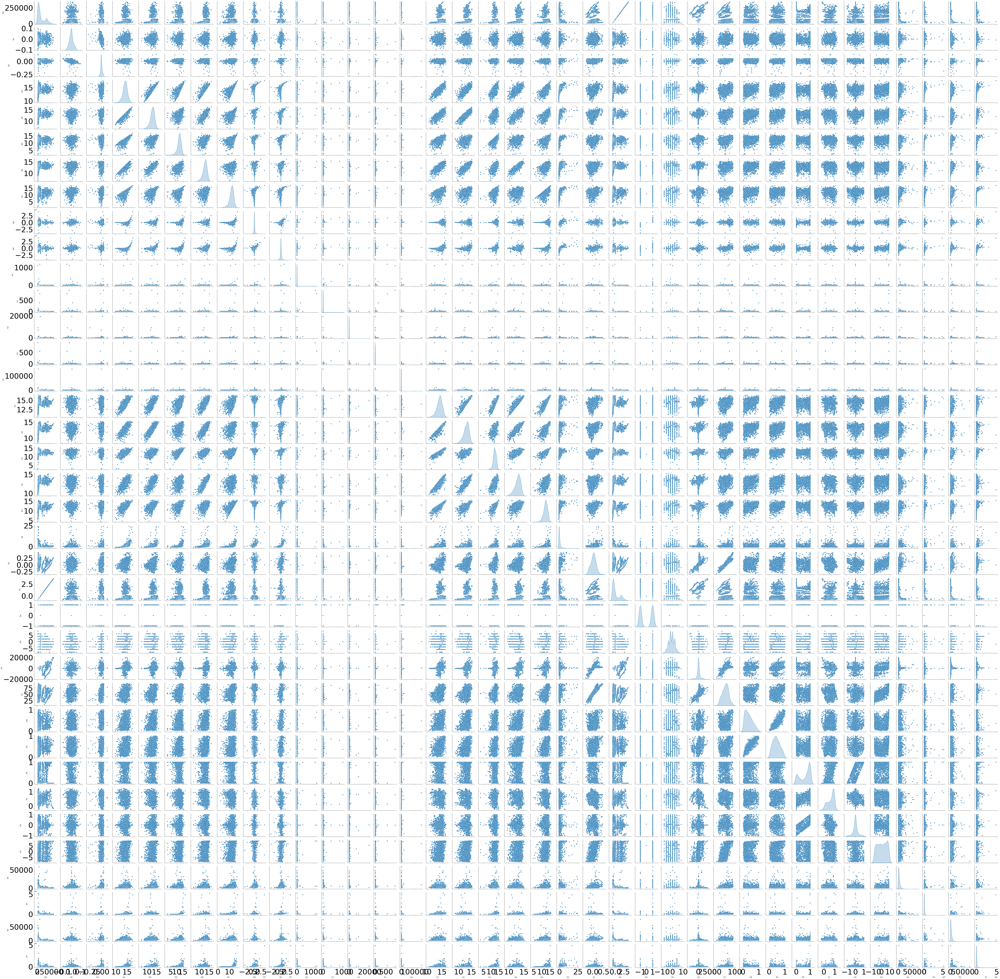

In [22]:
X_full =rasad1.copy()
y = rasad1.f38
X_full.drop(['f38'], axis=1, inplace=True)

#Select numerical columns
numerical_cols = [cname for cname in X_full.columns if
                X_full[cname].dtype in ['float64','int64']]

# Subset with numerical features
num = X_full[numerical_cols]
num.columns

# Univariate analysis looking at Mean, Variance, Standard Deviation, Skewness and Kurtosis
print(y.name,
    '\nMean :', np.mean(y),
      '\nVariance :', np.var(y),
      '\nStandard Deviation :', np.var(y)**0.5,
      '\nSkewness :', stats.skew(y),
      '\nKurtosis :', stats.kurtosis(y))
# new subset for a bivariate analysis
num2 = pd.concat([y,num], axis=1)
# Bivariate analysis with scatter-plot matrix
g = sns.pairplot(num2, kind ='scatter',diag_kind='kde')
for ax in g.axes.flatten():
    ax.tick_params(axis='x', labelsize=50)
    ax.tick_params(axis='y', labelsize=50)
plt.show()

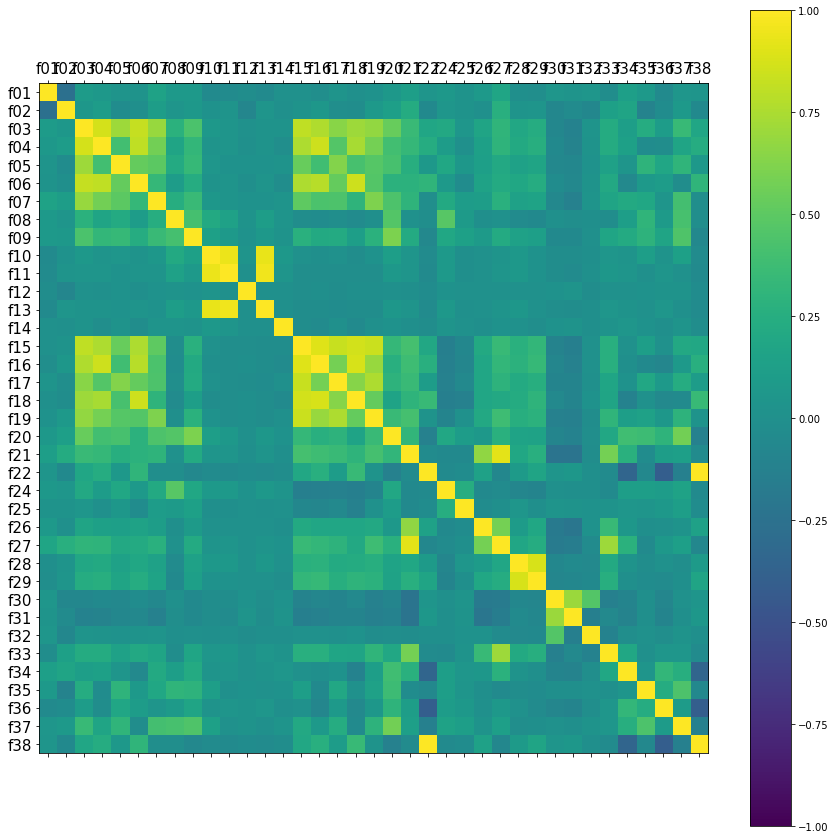

In [19]:
#rasad1=rasad.drop(['Date'],axis=1)

# Plot correlation matrix
correlation = rasad1.corr(method="pearson")

fig = plt.figure(figsize=(15,15))
ax = plt.subplot(111)

# Define colored axes
cax = ax.matshow(correlation, vmin=-1, vmax=1)
# Add colorbar
fig.colorbar(cax)
# Set ticks
ticks = np.arange(0, 37, 1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)

ax.set_xticklabels(rasad1.columns, fontsize=15)
ax.set_yticklabels(rasad1.columns, fontsize=15)

plt.show()

In [30]:
num_obs = rasad.Close.count()
factor_1 = pd.Series(np.random.randn(num_obs),index=rasad.Date)
factor_2 = pd.Series(np.random.randn(num_obs),index=rasad.Date)
factor_3 = pd.Series(np.random.randn(num_obs),index=rasad.Date)
outcome = 1.*factor_1 + 2.*factor_2 + 3.*factor_3 + 5.*np.random.randn(num_obs)
outcome.name = 'outcome'
print(outcome.tail())

Date
20230710    2.522129
20230711   -6.573360
20230712    1.473529
20230715   -1.869657
20230716    5.438710
Name: outcome, dtype: float64


In [24]:
outcomes = pd.DataFrame(index=features.index)
# next day's opening change
outcomes['close_1'] = rasad.Close.pct_change(-1).tolist() # next day's returns
outcomes['close_5'] = rasad.Close.pct_change(-5).tolist() # next week's returns
outcomes['close_10'] = rasad.Close.pct_change(-10).tolist() # next two weeks' returns
outcomes['close_20'] = rasad.Close.pct_change(-20) .tolist()# next month's (approx) returns

print(outcomes.tail())

           close_1  close_5  close_10  close_20
Date                                           
20230710  0.047512      NaN       NaN       NaN
20230711  0.001874      NaN       NaN       NaN
20230712 -0.022353      NaN       NaN       NaN
20230715 -0.000366      NaN       NaN       NaN
20230716       NaN      NaN       NaN       NaN


In [26]:
rasad1.dropna()

,f01,f02,f03,f04,f05,f06,f07,f08,f09,f10,...,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38
Date,,,,,,,,,,,,,,,,,,,,,
20120609,-0.032930,-0.000417,13.276553,9.591376,12.531917,12.507806,9.963547,392834.0,82054.0,2.061883,...,0.169788,0.440030,0.213280,0.247194,-1.057563,1829.750000,138520.0,9658.571429,21238.000000,11600
20120610,0.042753,-0.007931,13.881338,8.925454,13.174007,11.814947,12.896120,484686.0,793962.0,0.830858,...,0.235277,0.254522,0.240068,0.060869,-6.088673,1074.428571,263250.0,5410.360000,132920.666667,12000
20120613,0.000000,0.012756,11.970945,8.860357,11.184421,10.276670,10.819778,79490.0,96564.0,1.011272,...,0.302212,0.154043,0.244845,-0.100479,-4.661054,7047.000000,72000.0,5809.400000,50000.000000,11750
20120617,0.038961,-0.007732,13.748913,10.384987,12.984057,12.439111,12.279788,556288.0,780740.0,1.466679,...,0.209039,0.232554,0.221262,0.003074,-4.817833,10790.000000,435416.0,7426.058824,35883.333333,12000
20120620,-0.021284,-0.020262,11.761425,10.574006,10.126631,10.041117,10.625076,96732.0,100132.0,3.073003,...,0.236719,0.257656,0.234810,0.048134,0.529863,1700.217391,25000.0,2868.875000,41154.000000,11358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20230610,-0.052004,0.006466,14.197669,12.447928,13.077366,12.900931,12.713002,351606.0,-1111622.0,0.315671,...,0.489516,0.975648,0.879090,0.249219,-8.661301,437.666667,119500.0,2142.700535,110679.000000,154950
20230611,0.019667,-0.031946,13.968530,12.641514,12.519221,13.059336,11.637044,-300096.0,-1544902.0,-0.204782,...,0.572593,0.478911,0.894507,-0.521089,-8.587677,674.954148,54709.0,850.469203,56607.500000,152950
20230612,-0.039461,-0.005884,14.080660,13.052953,12.129953,12.950782,12.348644,138278.0,-536964.0,0.118658,...,0.698577,0.227455,0.811151,-0.717445,-8.698489,587.496222,37068.2,5074.289157,76882.333333,146050


In [25]:
%matplotlib inline
from IPython.display import display

from scipy.cluster import hierarchy
from scipy.spatial import distance

from sklearn.preprocessing import StandardScaler,Normalizer


#f = features.dropna() #optional - to compare apples to apples

# standardize or normalize data 
std_scaler = StandardScaler()
features_scaled = std_scaler.fit_transform(rasad1.dropna()) 
print (features_scaled.shape)
df = pd.DataFrame(features_scaled,index=rasad1.dropna().index)
df.columns = rasad1.dropna().columns
df.tail()

# standardize outcome as well 
outcome_df = outcome.to_frame()
outcome_scaled = std_scaler.fit_transform(outcome_df.dropna()) 
outcome_scaled = pd.DataFrame(outcome_scaled,index=outcome_df.dropna().index)
outcome_scaled.columns = outcome_df.columns
print(outcome_scaled.tail())

ValueError: Input X contains infinity or a value too large for dtype('float64').

In [70]:
from IPython.display import display

from scipy.cluster import hierarchy
from scipy.spatial import distance

from sklearn.preprocessing import StandardScaler,Normalizer

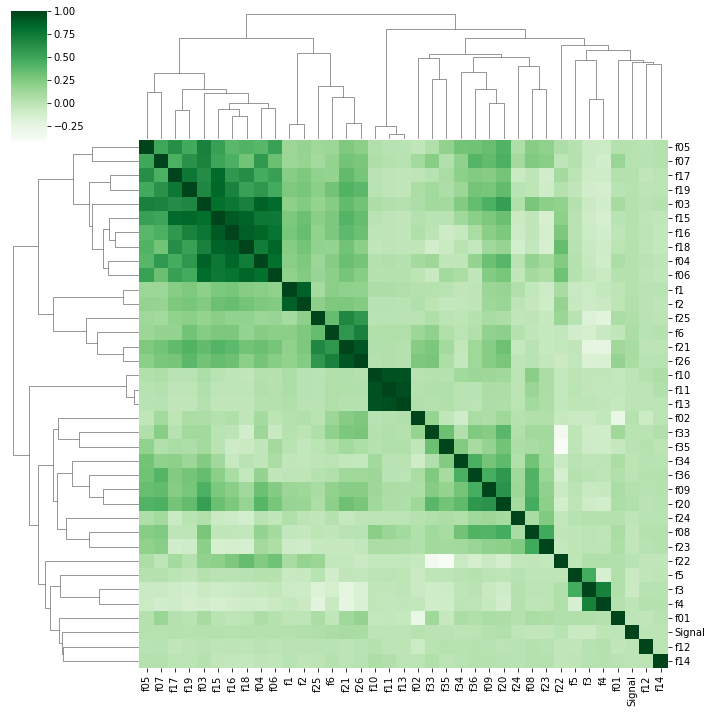

In [71]:
corr_matrix = rasad1.corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(10,10),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

In [75]:
corr_matrix['Signal']

f01      -0.011079
f02       0.023034
f03       0.034092
f04       0.038085
f05       0.023271
f06       0.034679
f07       0.026809
f08      -0.018857
f09       0.030941
f10      -0.001199
f11      -0.000114
f12      -0.001869
f13      -0.000334
f14      -0.001018
f15       0.036129
f16       0.027767
f17       0.029971
f18       0.035713
f19       0.024921
f20       0.040844
f21       0.092260
f22       0.016595
f23      -0.024442
f24      -0.012991
f25       0.054940
f26       0.078075
f1        0.038480
f2        0.042551
f3       -0.074113
f4       -0.007883
f5       -0.065254
f6        0.075704
f33       0.011444
f34      -0.000460
f35       0.009046
f36       0.001003
Signal    1.000000
Name: Signal, dtype: float64

In [64]:
corr_matrix[abs(corr_matrix['f38'])>0.1][['f03','f04','f06','f15','f16','f17','f18','f20','f22','f26','f29','f34','f36','f37','f38']]

,f03,f04,f06,f15,f16,f17,f18,f20,f22,f26,f29,f34,f36,f37,f38
f03,1.000000,0.868598,0.822231,0.804956,0.759969,0.641774,0.705020,0.535644,0.180401,0.168022,0.240227,0.121589,0.109097,0.347135,0.180401
f04,0.868598,1.000000,0.807201,0.756608,0.850319,0.463957,0.735007,0.396673,0.240350,0.138670,0.253882,0.135644,-0.021584,0.171656,0.240350
f06,0.822231,0.807201,1.000000,0.750552,0.782274,0.529727,0.848704,0.285256,0.309230,0.155817,0.237615,-0.054839,0.105407,-0.016825,0.309230
f15,0.804956,0.756608,0.750552,1.000000,0.903508,0.832707,0.864607,0.334799,0.199767,0.214304,0.323132,0.013040,0.010406,0.206782,0.199767
f16,0.759969,0.850319,0.782274,0.903508,1.000000,0.578801,0.880544,0.264634,0.261498,0.184937,0.339649,-0.003339,-0.083819,0.082666,0.261498
f17,0.641774,0.463957,0.529727,0.832707,0.578801,1.000000,0.636469,0.296813,0.102782,0.181213,0.257799,0.022049,0.083013,0.237698,0.102782
f18,0.705020,0.735007,0.848704,0.864607,0.880544,0.636469,1.000000,0.164037,0.344573,0.184126,0.299511,-0.109644,-0.061651,-0.040094,0.344573
f20,0.535644,0.396673,0.285256,0.334799,0.264634,0.296813,0.164037,1.000000,-0.123193,0.068679,0.150201,0.385434,0.302684,0.575624,-0.123193
f22,0.180401,0.240350,0.309230,0.199767,0.261498,0.102782,0.344573,-0.123193,1.000000,0.145354,0.169124,-0.350585,-0.405294,-0.127473,1.000000
f26,0.168022,0.138670,0.155817,0.214304,0.184937,0.181213,0.184126,0.068679,0.145354,1.000000,0.194996,0.055440,0.003771,0.027018,0.145354


In [48]:
linkage

array([[8.00000000e+00, 1.40000000e+01, 1.13314263e-15, 2.00000000e+00],
       [4.00000000e+00, 6.00000000e+00, 4.51980313e-01, 2.00000000e+00],
       [2.00000000e+00, 1.60000000e+01, 5.73552469e-01, 3.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 6.21184857e-01, 2.00000000e+00],
       [3.00000000e+00, 1.70000000e+01, 6.48333357e-01, 4.00000000e+00],
       [1.80000000e+01, 1.90000000e+01, 8.14998892e-01, 6.00000000e+00],
       [5.00000000e+00, 2.00000000e+01, 9.49440742e-01, 7.00000000e+00],
       [7.00000000e+00, 1.30000000e+01, 9.53581375e-01, 2.00000000e+00],
       [1.10000000e+01, 1.20000000e+01, 1.12953760e+00, 2.00000000e+00],
       [9.00000000e+00, 1.00000000e+01, 1.53220877e+00, 2.00000000e+00],
       [2.20000000e+01, 2.30000000e+01, 1.56544663e+00, 4.00000000e+00],
       [1.50000000e+01, 2.40000000e+01, 1.93828543e+00, 4.00000000e+00],
       [2.10000000e+01, 2.60000000e+01, 2.17661928e+00, 1.10000000e+01],
       [2.50000000e+01, 2.70000000e+01, 2.36957414e

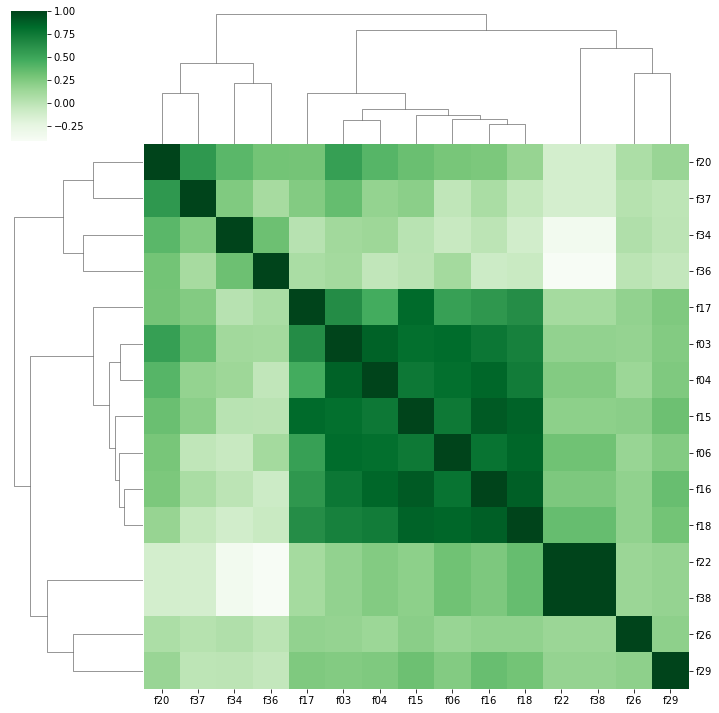

In [65]:
corr_matrix =corr_matrix[abs(corr_matrix['f38'])>0.1][['f03','f04','f06','f15','f16','f17','f18','f20','f22','f26','f29','f34','f36','f37','f38']]
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(10,10),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

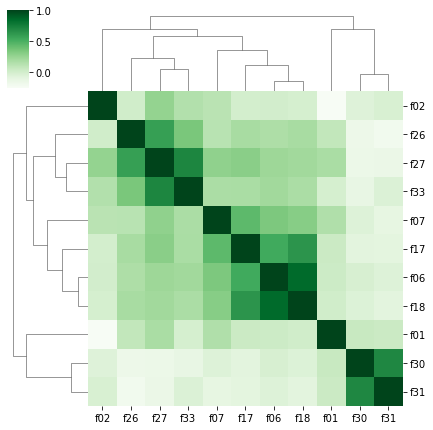

Correlation Strength:
f31    0.051450
f30    0.028384
f18    0.027110
f06    0.024256
f33    0.023695
f07    0.019802
f02    0.019681
f27    0.019560
f17    0.015457
f01    0.014919
f26    0.013282
dtype: float64


In [50]:
correlated_features = corr[corr>0.01].index.tolist()
corr_matrix = rasad1[correlated_features].corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(6,6),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns
print("Correlation Strength:")
print(corr[corr>0.01].sort_values(ascending=False))

C:\Users\Sharif\anaconda3\envs\notebook\lib\site-packages\seaborn\axisgrid.py:2100: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


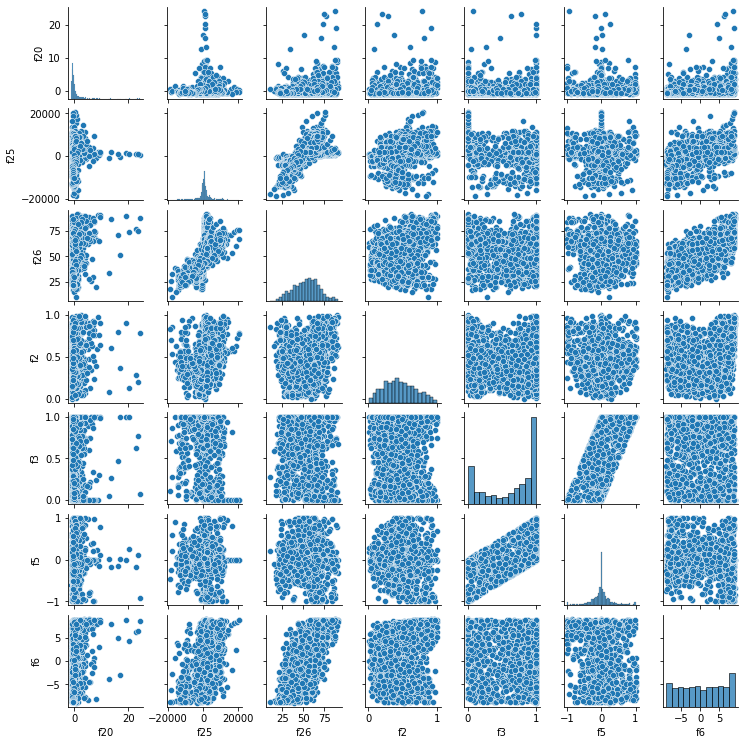

In [77]:
selected_features = ['f20','f25','f26','f2','f3','f5','f6']
import seaborn as sns
sns.pairplot(rasad1[selected_features],size=1.5)

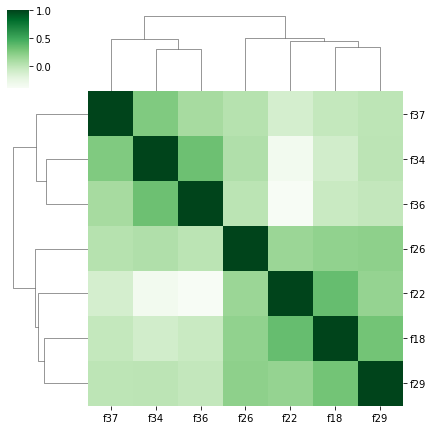

In [72]:
corr_matrix = rasad1[selected_features].corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(6,6),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

In [124]:
rasad2=features[['f20','f25','f26','f2','f3','f5','f6','Signal']]

In [125]:
rasad2['Date']=rasad.Date.tolist()
rasad2['Close']=rasad.Close.tolist()

C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\285243130.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad2['Date']=rasad.Date.tolist()
C:\Users\Sharif\AppData\Local\Temp\ipykernel_3040\285243130.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad2['Close']=rasad.Close.tolist()


In [127]:
rasad2

,f20,f25,f26,f2,f3,f5,f6,Signal,Date,Close
0,NaN,unknown,unknown,0.000000,0.000000,0.000000,0.000000,0,20110711,12500
1,NaN,unknown,unknown,0.000000,0.000000,0.000000,0.000000,0,20110712,12513
2,NaN,unknown,unknown,0.000000,0.000000,0.000000,0.000000,0,20110713,12502
3,NaN,unknown,unknown,0.000000,0.000000,0.000000,0.000000,0,20110719,12501
4,NaN,unknown,unknown,0.000000,0.000000,0.000000,0.000000,0,20110720,12500
...,...,...,...,...,...,...,...,...,...,...
2636,NaN,-6878.349985,34.996847,0.296359,1.000000,0.093904,-0.226698,0,20230710,140000
2637,NaN,-7205.514613,30.024964,0.291115,1.000000,0.005133,-3.953175,0,20230711,133650
2638,NaN,-7399.669071,29.845194,0.450181,0.999717,0.221131,-6.809376,0,20230712,133400
2639,NaN,-7224.15283,34.961427,0.508836,0.992386,-0.007614,-7.833776,0,20230715,136450


In [82]:
rasad2['Date']=rasad1.index.tolist()
rasad2

C:\Users\Sharif\AppData\Local\Temp\ipykernel_17700\3044873360.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rasad2['Date']=rasad1.index.tolist()


,f38,f22,f18,f26,f37,f34,f36,f29,Date
Date,,,,,,,,,
20120609,11600,-0.779757,11.848095,-366.414265,21238.000000,1829.750000,9658.571429,0.169788,20120609
20120610,12000,-0.774327,11.892140,-344.585466,132920.666667,1074.428571,5410.360000,0.235277,20120610
20120613,11750,-0.777721,11.553415,-328.594279,50000.000000,7047.000000,5809.400000,0.302212,20120613
20120617,12000,-0.774327,11.621042,-295.954444,35883.333333,10790.000000,7426.058824,0.209039,20120617
20120620,11358,-0.783043,11.532463,-302.187542,41154.000000,1700.217391,2868.875000,0.236719,20120620
...,...,...,...,...,...,...,...,...,...
20230610,154950,1.166303,12.876884,-7661.816243,110679.000000,437.666667,2142.700535,0.489516,20230610
20230611,152950,1.139152,12.965345,-8489.222464,56607.500000,674.954148,850.469203,0.572593,20230611
20230612,146050,1.045480,12.996485,-9591.159277,76882.333333,587.496222,5074.289157,0.698577,20230612


In [81]:
rasad1.index

Index([20120609, 20120610, 20120613, 20120617, 20120620, 20120704, 20120709,
       20120711, 20120714, 20120721,
       ...
       20230530, 20230531, 20230603, 20230606, 20230607, 20230610, 20230611,
       20230612, 20230613, 20230614],
      dtype='int64', name='Date', length=1698)

In [128]:
rasad2.to_csv('data1.csv',sep=',',index=False,encoding='utf-8')

In [68]:
df=pd.read_excel(r"C:\Users\Sharif\Desktop\data.xlsx")
df

,f01,f02,f03,f04,f05,f06,f07,f08,f09,f10,...,ATR,ADX,MACD_signal,fMACD,RSI,Close_EMA_10,EMA_10_EMA_30,MACD_Signal_MACD,return,Date
0,-0.088837,-0.012251,0.891728,-3.685177,-0.719223,-0.075602,-0.000068,0.939084,0.213418,0.625949,...,0.000830,29.534073,-0.001057,-0.001106,33.437686,-1,-1,1,-0.105361,20120609
1,0.152951,-0.036289,0.563481,-4.955883,-0.700264,-1.373245,-0.000002,-0.682563,-0.488623,-0.279815,...,0.000817,30.660139,-0.001053,-0.001040,42.397094,-1,-1,-1,0.105361,20120610
2,0.011138,0.029621,0.635885,-3.110588,-0.740925,-1.001134,-0.000018,0.335691,0.378334,0.216157,...,0.000868,34.380101,-0.001025,-0.000992,39.931176,-1,-1,-1,0.040267,20120613
3,0.139310,-0.035468,0.720967,-3.363926,-0.729644,-0.616656,-0.000005,0.544526,-0.386221,0.360161,...,0.000832,36.161376,-0.000993,-0.000893,45.858944,1,-1,-1,0.094311,20120617
4,-0.058141,-0.072746,0.664527,-1.187419,-1.270943,-1.027170,-0.000023,0.432389,0.386217,0.286126,...,0.000873,37.327318,-0.000953,-0.000912,36.769320,-1,-1,-1,-0.135428,20120620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1693,-0.044151,-0.004289,0.749275,-1.749741,-0.929362,-0.603592,-0.000003,-0.323659,0.149375,-0.132695,...,0.013731,21.583799,-0.015602,-0.023126,25.963645,-1,-1,1,-0.049454,20230610
1694,0.032144,-0.044329,0.871474,-1.327016,-1.141060,-0.216048,-0.000012,0.274967,0.597357,0.129979,...,0.012827,23.437571,-0.017606,-0.025623,24.939356,-1,-1,1,-0.013704,20230611
1695,-0.030979,-0.017156,0.799919,-1.027707,-1.507811,-0.436732,-0.000005,-0.165072,-0.306911,-0.069055,...,0.012067,25.373302,-0.019875,-0.028949,21.751171,-1,-1,1,-0.048773,20230612
1696,0.058594,-0.053641,0.860475,-0.768364,-2.694710,-0.182765,-0.000015,0.138922,0.121999,0.062427,...,0.011658,27.561245,-0.022133,-0.031165,22.139546,-1,-1,1,0.001809,20230613


In [71]:
L=[]
for j in range(2641-1698):
    L.append(0)
a=0
for i in range(len(df.MACD_Signal_MACD)):
    if a==1 and df.MACD_Signal_MACD[i]==1 or a==-1 and df.MACD_Signal_MACD[i]==-1:
        L.append(0)
    elif a==1 and df.MACD_Signal_MACD[i]==-1 or a==-1 and df.MACD_Signal_MACD[i]==1:
        a=df.MACD_Signal_MACD[i]
        L.append(df.MACD_Signal_MACD[i])
    elif a==0 and df.MACD_Signal_MACD[i]==-1 or a==0 and df.MACD_Signal_MACD[i]==1:
        a=df.MACD_Signal_MACD[i]
        L.append(df.MACD_Signal_MACD[i])        
L

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [73]:
rasad.Close.tolist()

[12500,
 12513,
 12502,
 12501,
 12500,
 12503,
 12530,
 12630,
 12512,
 12500,
 12500,
 12501,
 12500,
 12500,
 12501,
 12500,
 12500,
 12500,
 12490,
 12350,
 12430,
 12350,
 12300,
 12350,
 12400,
 12300,
 12300,
 12350,
 12350,
 12350,
 12350,
 12350,
 12350,
 12350,
 12358,
 12400,
 12362,
 12400,
 12378,
 12378,
 12424,
 12427,
 12447,
 12600,
 12655,
 12605,
 12600,
 12515,
 12501,
 12504,
 12504,
 12525,
 12700,
 12609,
 12506,
 12500,
 12500,
 12500,
 12500,
 12500,
 12501,
 12600,
 12501,
 12500,
 12500,
 12500,
 12500,
 12500,
 12500,
 12550,
 12500,
 12500,
 12500,
 12500,
 12400,
 12002,
 12150,
 11750,
 11250,
 11350,
 11626,
 11626,
 11997,
 11779,
 11750,
 11500,
 11200,
 10614,
 10210,
 10600,
 10900,
 11229,
 11521,
 11500,
 11480,
 11610,
 11722,
 11728,
 11728,
 11728,
 11728,
 11728,
 11728,
 11420,
 10851,
 10560,
 11000,
 10856,
 10516,
 10533,
 10650,
 11650,
 11199,
 11000,
 12139,
 12052,
 11999,
 11730,
 12050,
 12604,
 13167,
 13400,
 13570,
 13156,
 13300,


In [74]:
datas={
    "signal":L,
    "Close":rasad.Close.tolist() 
}
sample_eval_data=pd.DataFrame(datas)
print(sample_eval_data)

      signal   Close
0          0   12500
1          0   12513
2          0   12502
3          0   12501
4          0   12500
...      ...     ...
2636       0  140000
2637       0  133650
2638       0  133400
2639       0  136450
2640       0  136500

[2641 rows x 2 columns]


In [76]:
L[-1]

0

In [77]:
import numpy as np
import pandas as pd


def eval_strategy():

    #df = pd.read_csv("./sample_eval_data.csv")

    bot = Bot(sample_eval_data)
    bot.trade()

    profit, win_rate = bot.get_profit(), bot.get_win_rate()


    return profit, win_rate


class Bot:
    """
    This class provide tradding management and work with sell and buy condition.

    input:
        - df: pd.DataFrame
                columns=['close', 'signal'],
                signal=[-1, 0, 1] such that : -1: buy, 0: hold, 1: sell
    """

    def __init__(self, df: pd.DataFrame) -> None:
        self.df = df
        self.df['signal'] = self.df['signal'].astype(float)
        self.trades = list()
        self.in_trade = False

    def trade(self):
        """ trade function work with signal """

        for i in self.df.index:
            # buy
            if self.df.loc[i, 'signal'] == -1 and not self.in_trade:

                position = dict()
                position[i] = self.df.loc[i, 'Close']
                self.in_trade = True
            # sell
            elif self.df.loc[i, 'signal'] == 1 and self.in_trade:

                position[i] = self.df.loc[i, 'Close']
                self.trades.append(position)
                self.in_trade = False
            # hold
            elif self.df.loc[i, 'signal'] == 0:
                continue

    def get_win_rate(self):
        return np.round(sum(
            [1 if list(pos.values())[0] < list(pos.values())
             [1] else 0 for pos in self.trades]
        ) / len(self.trades), 4)

    def get_profit(self):

        profit = 1
        for pos in self.trades:
            cl = np.array(list(pos.values()))
            profit *= cl[1:] / cl[:-1] - 0.0125

        return np.round(profit[0], 4)

    def __len__(self):
        return len(self.trades)

    def __repr__(self):
        return f"<WinRate: {self.get_win_rate()}, Profit: {self.get_profit()}>"

if __name__ == "__main__":
    profit, win_rate = eval_strategy()
    print("profit:", profit,"\nwin_rate:", win_rate)


profit: 1.0481 
win_rate: 0.6286


In [20]:
df=pd.read_csv(r"C:\Users\Sharif\Downloads\feature-rasad-target1.csv")
df.head()

,Unnamed: 0,Date,Open,High,Low,Close,v_i_buy,v_n_buy,v_i_sell,v_n_sell,...,ATR,ADX,RSI,MACD,MACD_signal,Close_EMA_10,EMA_10_EMA_30,MACD_Signal_MACD,return,target
0,0,20110711,12500,12500,12500,12500,30320681.0,89389319.0,0.0,119710000.0,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,NaN,1
1,1,20110712,12610,12940,12511,12513,839652.0,2603130.0,3327282.0,115500.0,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,0.002885,0
2,2,20110713,12515,12685,12501,12502,305908.0,6485132.0,6324540.0,466500.0,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,-0.002440,0
3,3,20110719,12629,12629,12500,12501,98549.0,1580602.0,1578151.0,101000.0,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,-0.000222,0
4,4,20110720,12501,12515,12500,12500,104577.0,2076431.0,1822008.0,359000.0,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,-0.000222,0


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2641 entries, 0 to 2640
Data columns (total 32 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        2641 non-null   int64  
 1   Date              2641 non-null   int64  
 2   Open              2641 non-null   int64  
 3   High              2641 non-null   int64  
 4   Low               2641 non-null   int64  
 5   Close             2641 non-null   int64  
 6   v_i_buy           2638 non-null   float64
 7   v_n_buy           2638 non-null   float64
 8   v_i_sell          2638 non-null   float64
 9   v_n_sell          2638 non-null   float64
 10  n_i_buy           2638 non-null   float64
 11  n_n_buy           2638 non-null   float64
 12  n_i_sell          2638 non-null   float64
 13  n_n_sell          2638 non-null   float64
 14  f1                2641 non-null   float64
 15  f2                2641 non-null   float64
 16  f3                2641 non-null   float64


In [59]:
features['EMA_10']=df.EMA_10.tolist()
features['EMA_30']=df.EMA_30.tolist()
features['ATR']=df.ATR.tolist()
features['ADX']=df.ADX.tolist()
features['MACD_signal']=df.MACD_signal.tolist()
features['fMACD']=(df.MACD).tolist()
features['RSI']=(df.RSI).tolist()
features['Close_EMA_10']=df.Close_EMA_10.tolist()
features['EMA_10_EMA_30']=df.EMA_10_EMA_30 .tolist()
features['MACD_Signal_MACD']=(df.MACD_Signal_MACD).tolist()
features['return']=df['return'].tolist()

In [60]:
features['Date']=df['Date'].tolist()

In [63]:
f.to_csv('data.csv',sep=',',index=False,encoding='utf-8')

In [61]:
features

,f01,f02,f03,f04,f05,f06,f07,f08,f09,f10,...,ATR,ADX,MACD_signal,fMACD,RSI,Close_EMA_10,EMA_10_EMA_30,MACD_Signal_MACD,return,Date
0,0.011138,NaN,0.440922,-2.066389,-0.849808,-inf,-4.629013e-09,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,NaN,20110711
1,-0.010138,0.013160,0.923839,-2.104195,-0.842668,-0.034124,-1.315104e-05,0.964803,NaN,0.620796,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,0.002885,20110712
2,0.008226,-0.010577,0.892942,-3.793222,-0.716459,-0.071167,-3.091760e-06,-0.076637,NaN,-0.030424,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,-0.002440,20110713
3,-0.016822,0.016884,0.897746,-3.528637,-0.723846,-0.062035,-1.439672e-05,0.011759,NaN,0.004815,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,-0.000222,20110719
4,0.010913,-0.011015,0.853175,-3.730766,-0.718017,-0.179848,-3.752332e-06,-0.106979,NaN,-0.043592,...,NaN,NaN,NaN,NaN,NaN,-1,-1,-1,-0.000222,20110720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2636,-0.008394,-0.011015,0.917795,-0.956611,-1.671007,-0.070899,-4.310167e-05,0.119440,0.148420,0.050094,...,0.011572,27.755733,-0.023017,-0.020761,34.996847,-1,-1,-1,-0.019505,20230710
2637,-0.030157,-0.018507,0.922453,-0.746766,-3.003444,-0.000503,-7.586200e-03,0.011689,0.800848,0.004668,...,0.011464,28.330664,-0.022763,-0.021749,30.024964,-1,-1,-1,-0.049302,20230711
2638,0.009930,-0.011802,0.886371,-0.802230,-2.368043,-0.122913,-2.502307e-05,-0.089144,0.238111,-0.035439,...,0.011285,29.278364,-0.022677,-0.022335,29.845194,-1,-1,-1,-0.001992,20230712
2639,0.032437,-0.007860,0.774774,-0.735376,-3.226215,-0.429129,-6.332558e-06,-0.256206,-0.098436,-0.105595,...,0.011746,30.158370,-0.022503,-0.021805,34.961427,-1,-1,-1,0.024031,20230715


In [62]:
f = features.dropna()
f

,f01,f02,f03,f04,f05,f06,f07,f08,f09,f10,...,ATR,ADX,MACD_signal,fMACD,RSI,Close_EMA_10,EMA_10_EMA_30,MACD_Signal_MACD,return,Date
200,-0.088837,-0.012251,0.891728,-3.685177,-0.719223,-0.075602,-0.000068,0.939084,0.213418,0.625949,...,0.000830,29.534073,-0.001057,-0.001106,33.437686,-1,-1,1,-0.105361,20120609
201,0.152951,-0.036289,0.563481,-4.955883,-0.700264,-1.373245,-0.000002,-0.682563,-0.488623,-0.279815,...,0.000817,30.660139,-0.001053,-0.001040,42.397094,-1,-1,-1,0.105361,20120610
204,0.011138,0.029621,0.635885,-3.110588,-0.740925,-1.001134,-0.000018,0.335691,0.378334,0.216157,...,0.000868,34.380101,-0.001025,-0.000992,39.931176,-1,-1,-1,0.040267,20120613
206,0.139310,-0.035468,0.720967,-3.363926,-0.729644,-0.616656,-0.000005,0.544526,-0.386221,0.360161,...,0.000832,36.161376,-0.000993,-0.000893,45.858944,1,-1,-1,0.094311,20120617
208,-0.058141,-0.072746,0.664527,-1.187419,-1.270943,-1.027170,-0.000023,0.432389,0.386217,0.286126,...,0.000873,37.327318,-0.000953,-0.000912,36.769320,-1,-1,-1,-0.135428,20120620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2614,-0.044151,-0.004289,0.749275,-1.749741,-0.929362,-0.603592,-0.000003,-0.323659,0.149375,-0.132695,...,0.013731,21.583799,-0.015602,-0.023126,25.963645,-1,-1,1,-0.049454,20230610
2615,0.032144,-0.044329,0.871474,-1.327016,-1.141060,-0.216048,-0.000012,0.274967,0.597357,0.129979,...,0.012827,23.437571,-0.017606,-0.025623,24.939356,-1,-1,1,-0.013704,20230611
2616,-0.030979,-0.017156,0.799919,-1.027707,-1.507811,-0.436732,-0.000005,-0.165072,-0.306911,-0.069055,...,0.012067,25.373302,-0.019875,-0.028949,21.751171,-1,-1,1,-0.048773,20230612
2617,0.058594,-0.053641,0.860475,-0.768364,-2.694710,-0.182765,-0.000015,0.138922,0.121999,0.062427,...,0.011658,27.561245,-0.022133,-0.031165,22.139546,-1,-1,1,0.001809,20230613


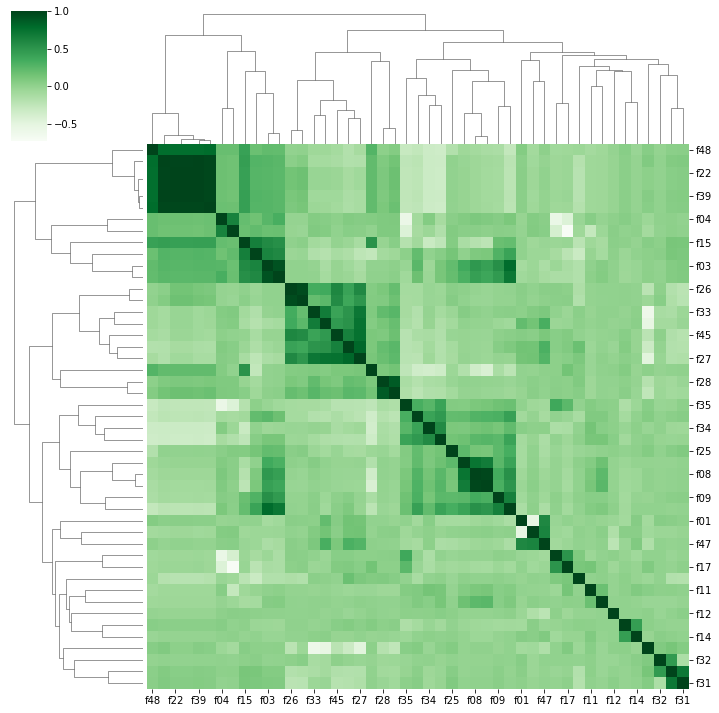

In [47]:
from IPython.display import display

from scipy.cluster import hierarchy
from scipy.spatial import distance

from sklearn.preprocessing import StandardScaler,Normalizer

corr_matrix = f.corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(10,10),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

In [53]:
corr_matrix[abs(corr_matrix['f38'])>0.1][['f03','f04','f06','f15','f16','f17','f18','f20','f21','f22','f26','f29','f34','f35','f36','f37','f38','f39','f40','f41','f42','f43','f48']]

,f03,f04,f06,f15,f16,f17,f18,f20,f21,f22,...,f36,f37,f38,f39,f40,f41,f42,f43,f48,f38
f03,1.000000,0.254013,0.925717,0.570776,0.175434,-0.120281,0.617555,0.786628,-0.073241,0.255145,...,0.114859,0.251377,0.255145,0.261884,0.263377,0.262815,-0.167325,-0.001161,0.219639,0.255145
f04,0.254013,1.000000,0.325817,0.202285,0.635493,-0.439402,0.159430,0.104030,0.071489,0.167397,...,-0.103179,-0.085767,0.167397,0.164839,0.167069,0.175817,-0.040855,-0.017959,0.190400,0.167397
f06,0.925717,0.325817,1.000000,0.538527,0.182329,-0.134030,0.587999,0.712960,-0.047638,0.245584,...,0.112867,0.167645,0.245584,0.250532,0.251989,0.252160,-0.165434,0.000535,0.207179,0.245584
f15,0.570776,0.202285,0.538527,1.000000,0.181725,-0.031080,0.653846,0.205502,-0.047212,0.427646,...,-0.238922,-0.079868,0.427646,0.434193,0.435958,0.431843,-0.212767,0.025361,0.415335,0.427646
f16,0.175434,0.635493,0.182329,0.181725,1.000000,-0.721191,0.217293,0.031782,0.040483,0.154233,...,-0.160527,-0.108057,0.154233,0.151097,0.153912,0.169781,-0.066074,-0.038664,0.189974,0.154233
f18,0.617555,0.159430,0.587999,0.653846,0.217293,-0.214142,1.000000,0.407584,-0.147405,0.266444,...,0.046029,0.212522,0.266444,0.274018,0.279101,0.273032,-0.307649,-0.030471,0.176703,0.266444
f19,-0.004357,0.064758,0.006931,0.516980,0.001230,0.142858,-0.258488,-0.217703,0.101151,0.219400,...,-0.332375,-0.350691,0.219400,0.217368,0.213429,0.219523,0.070927,0.066348,0.278982,0.219400
f20,0.786628,0.104030,0.712960,0.205502,0.031782,-0.082858,0.407584,1.000000,0.089258,-0.220737,...,0.401916,0.423491,-0.220737,-0.215565,-0.216398,-0.219393,-0.002119,-0.009707,-0.264094,-0.220737
f21,-0.073241,0.071489,-0.047638,-0.047212,0.040483,0.073904,-0.147405,0.089258,1.000000,-0.107247,...,-0.173184,-0.181122,-0.107247,-0.130279,-0.163600,-0.138124,0.176730,0.379288,-0.171708,-0.107247
f22,0.255145,0.167397,0.245584,0.427646,0.154233,-0.045724,0.266444,-0.220737,-0.107247,1.000000,...,-0.332616,-0.234522,1.000000,0.997674,0.991624,0.985099,-0.202434,0.162640,0.766432,1.000000


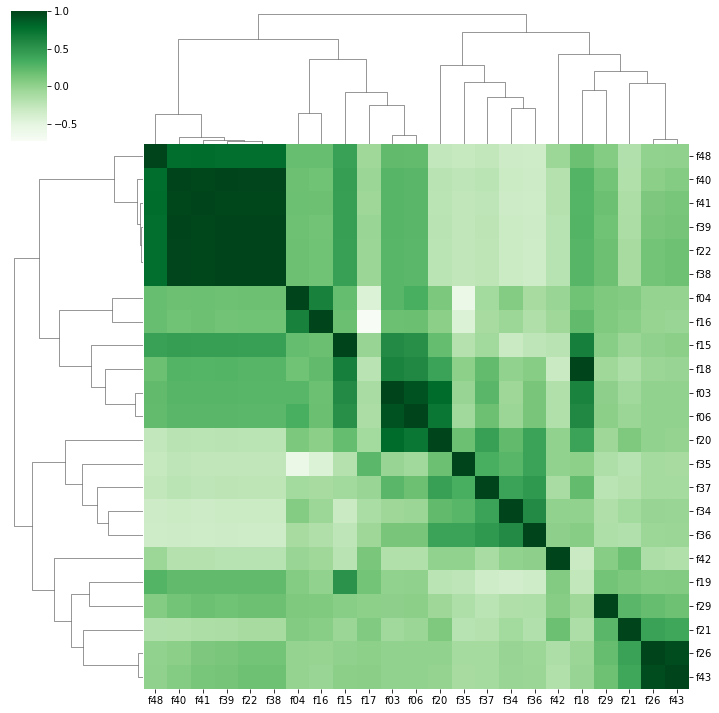

In [52]:
corr_matrix=corr_matrix[abs(corr_matrix['f38'])>0.1][['f03','f04','f06','f15','f16','f17','f18','f20','f21','f22','f26','f29','f34','f35','f36','f37','f38','f39','f40','f41','f42','f43','f48']]
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(10,10),cmap='Greens')
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

In [46]:
len(correlations_array)

47